## 1. Introduction

### Project Overview

This project investigates the **multiclass image-classification** problem on brain MRI scans into four categories — Glioma, Meningioma, Pituitary Tumor, and No Tumor — using deep learning computer vision. The objective is to develop and compare two modeling strategies:

- **A custom Convolutional Neural Network** (CNN) trained from scratch.

- **A Transfer Learning model based on EfficientNetB0** with fine-tuning of the top layers.

Beyond accuracy, the project integrates **Grad-CAM** to assess model interpretability and verify that predictions rely on medically relevant tumor regions.


### Dataset summary

The dataset consists of labeled brain MRI images grouped into four main categories. Images present variations in acquisition quality, brightness, orientation, and anatomical details, making the classification task non-trivial and well-suited for deep learning.

**Dataset characteristics**

Total images: 5712 MRI scans (Train set) & 1311 (Test set)

Classes (4): Glioma, Meningioma, Pituitary Tumor, No Tumor

Data type: Grayscale or RGB MRI axial slices (JPG/PNG)

Image resolution: 512x512 (resized to 224×224 for model input)

In [4]:
# ================================================================
# 1. Imports
# ================================================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

from PIL import Image

import plotly.express as px
from IPython.display import display

In [5]:
# ================================================================
# 2. Dataset Paths
# ================================================================
base_path = "/kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/classification"
train_path = os.path.join(base_path, "Training")
test_path = os.path.join(base_path, "Testing")


# ================================================================
# 3. Data Loading Function
# ================================================================
def load_image_data(data_path):
    """
    Load image paths and metadata (label, size, mode) from a classification dataset.
    """
    images, labels, img_sizes, img_modes = [], [], [], []

    for subfolder in os.listdir(data_path):
        subfolder_path = os.path.join(data_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        
        for img_file in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, img_file)
            if not img_path.lower().endswith((".jpg", ".jpeg", ".png")):
                continue
            
            try:
                with Image.open(img_path) as img:
                    img_sizes.append(img.size)
                    img_modes.append(img.mode)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")
                continue

            images.append(img_path)
            labels.append(subfolder)

    return pd.DataFrame({
        "image_path": images,
        "label": labels,
        "image_size": img_sizes,
        "image_mode": img_modes
    })


# ================================================================
# 4. Load Training and Testing DataFrames
# ================================================================
train_df = load_image_data(train_path)
test_df = load_image_data(test_path)

## 2. EDA & Preprocessing

In [4]:
# ================================================================
# 5. Dataset Overview Visualization
# ================================================================
def show_dataset_overview(df, name="Dataset"):
    """
    Display dataset statistics, class distribution, and image size frequencies.
    """
    print(f"\n=== {name.upper()} OVERVIEW ===\n")

    # --- Summary table ---
    summary_data = {
        "Total images": [len(df)],
        "Number of classes": [df["label"].nunique()]
    }
    display(pd.DataFrame(summary_data, index=["Stats"]))

    # --- Class distribution ---
    print("\nClass Distribution:")
    class_counts = df["label"].value_counts().reset_index()
    class_counts.columns = ["label", "count"]

    fig_pie = px.pie(
        class_counts,
        names="label",
        values="count",
        title=f"Class Distribution - {name}",
        hole=0.3
    )
    fig_pie.update_traces(textposition="inside", textinfo="percent+label")
    fig_pie.show()

    # --- Top image sizes ---
    size_counts = df["image_size"].astype(str).value_counts().head(10).reset_index()
    size_counts.columns = ["size", "count"]

    fig_bar = px.bar(
        size_counts,
        x="size",
        y="count",
        title=f"Top 10 Image Sizes - {name}",
        color="size",
        text_auto=True
    )
    fig_bar.update_layout(xaxis_title="Image Size (Width, Height)")
    fig_bar.show()


# Display training + testing overview
show_dataset_overview(train_df, name="Training Set")
print("_" * 112)
show_dataset_overview(test_df, name="Testing Set")


=== TRAINING SET OVERVIEW ===



,Total images,Number of classes
Stats,5712,4



Class Distribution:


________________________________________________________________________________________________________________

=== TESTING SET OVERVIEW ===



,Total images,Number of classes
Stats,1311,4



Class Distribution:


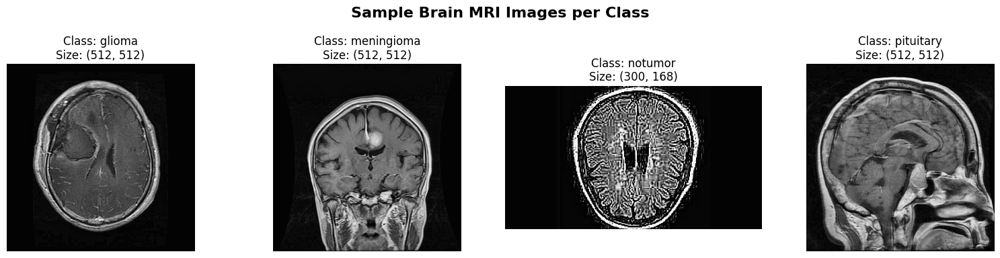

In [7]:
# ================================================================
# 6. Display Sample Images per Class
# ================================================================
def display_sample_images(df):
    """
    Display one random sample per class in a dynamic grid.
    """
    sampled = df.groupby("label").sample(n=1).reset_index(drop=True)
    n_classes = len(sampled)

    ncols = min(n_classes, 4)
    nrows = (n_classes - 1) // ncols + 1

    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
    axes = axes.flatten()

    fig.suptitle("Sample Brain MRI Images per Class", fontsize=16, fontweight="bold")

    for idx, (_, row) in enumerate(sampled.iterrows()):
        ax = axes[idx]
        try:
            img = Image.open(row["image_path"])
            ax.imshow(img, cmap="gray")
            ax.set_title(f"Class: {row['label']}\nSize: {img.size}")
            ax.axis("off")
        except Exception as e:
            print(f"Error loading {row['image_path']}: {e}")
            ax.axis("off")

    # Hide unused axes
    for i in range(idx + 1, len(axes)):
        axes[i].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


# Display sample images from training set
display_sample_images(train_df)

In [5]:
# ================================================================
# 1. Imports and Constants
# ================================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_WIDTH = 224
IMG_HEIGHT = 224
TARGET_SIZE = (IMG_WIDTH, IMG_HEIGHT)
BATCH_SIZE = 32
VAL_SPLIT = 0.2

# ================================================================
# 2. Train/Validation Split
# ================================================================
# Stratified split ensures class balance in both sets
df_train, df_val = train_test_split(
    train_df,
    test_size=VAL_SPLIT,
    stratify=train_df["label"],
    random_state=42
)

# ================================================================
# 3. Data Augmentation (Training)
# ================================================================
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode="nearest"
)

# No augmentation for validation and test sets
no_aug_datagen = ImageDataGenerator(rescale=1./255)

# ================================================================
# 4. Data Generators
# ================================================================
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    x_col="image_path",
    y_col="label",
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=True
)

validation_generator = no_aug_datagen.flow_from_dataframe(
    df_val,
    x_col="image_path",
    y_col="label",
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=False
)

test_generator = no_aug_datagen.flow_from_dataframe(
    test_df,
    x_col="image_path",
    y_col="label",
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=False
)

print(f"Classes found and encoded: {train_generator.class_indices}\n")

Found 4569 validated image filenames belonging to 4 classes.
Found 1143 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.
Classes found and encoded: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}



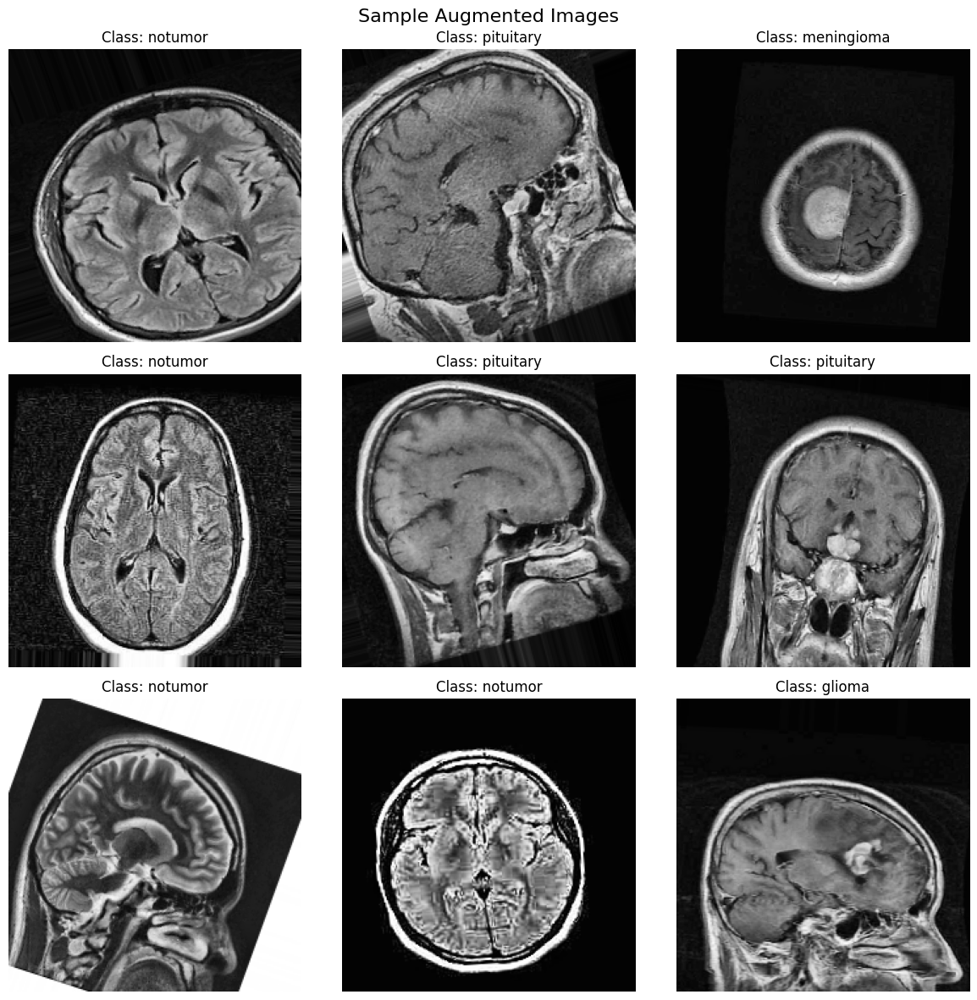

In [9]:
# ================================================================
# 5. Visualize Augmented Samples
# ================================================================
images, labels_onehot = next(train_generator)  # One batch
idx_to_class = {v: k for k, v in train_generator.class_indices.items()}
labels_idx = np.argmax(labels_onehot, axis=1)

plt.figure(figsize=(12, 12))
plt.suptitle("Sample Augmented Images", fontsize=16)

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i])
    plt.title(f"Class: {idx_to_class[labels_idx[i]]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## 3. Custom CNN development

In [10]:
# ================================================================
# 6. CNN Model Architecture
# ================================================================
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

NUM_CLASSES = len(train_generator.class_indices)
INPUT_SHAPE = (IMG_WIDTH, IMG_HEIGHT, 3)
EPOCHS = 30

In [7]:
model = Sequential(name="Baseline_CNN")

# --- Block 1: Low-level features ---
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=INPUT_SHAPE))
model.add(MaxPooling2D((2, 2)))


# --- Block 2 ---
model.add(Conv2D(64, (3, 3), activation="relu"))
model.add(MaxPooling2D((2, 2)))

# --- Block 3 ---
model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D((2, 2)))

# --- Block 4 ---
model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D((2, 2)))

# --- Classification Head ---
model.add(Flatten())
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(NUM_CLASSES, activation="softmax"))


model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

2025-11-16 10:20:12.987064: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     4,718,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,960,708 (18.92 MB)

 Trainable params: 4,960,708 (18.92 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
# ================================================================
# 7. Callbacks
# ================================================================
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

checkpoint_cb = ModelCheckpoint(
    "best_cnn_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

early_stopping_cb = EarlyStopping(
    monitor="val_loss",
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

callbacks_list = [checkpoint_cb, early_stopping_cb, reduce_lr_cb]

In [ ]:
# ================================================================
# 8. Train the Model
# ================================================================
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=EPOCHS,
    callbacks=callbacks_list
)

print("\n--- Training Completed ---")

# ================================================================
# 9. Training Curves
# ================================================================
def plot_training_history(history):
    """Plot accuracy and loss curves."""
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs_range = range(len(acc))

    plt.figure(figsize=(14, 6))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train")
    plt.plot(epochs_range, val_acc, label="Validation")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train")
    plt.plot(epochs_range, val_loss, label="Validation")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    plt.suptitle("CNN Training History", fontsize=16)
    plt.show()

plot_training_history(history)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/30


I0000 00:00:1763273869.052905     109 service.cc:148] XLA service 0x7c3260006850 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763273869.053891     109 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1763273869.053914     109 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1763273869.403768     109 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/143 ━━━━━━━━━━━━━━━━━━━━ 21:18 9s/step - accuracy: 0.2500 - loss: 1.3969

I0000 00:00:1763273874.879773     109 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - accuracy: 0.4753 - loss: 1.0943
Epoch 1: val_loss improved from inf to 1.02804, saving model to best_cnn_model.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 70s 430ms/step - accuracy: 0.4761 - loss: 1.0931 - val_accuracy: 0.6203 - val_loss: 1.0280 - learning_rate: 0.0010
Epoch 2/30
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step - accuracy: 0.7126 - loss: 0.7094
Epoch 2: val_loss improved from 1.02804 to 0.69833, saving model to best_cnn_model.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 56s 390ms/step - accuracy: 0.7127 - loss: 0.7093 - val_accuracy: 0.7113 - val_loss: 0.6983 - learning_rate: 0.0010
Epoch 3/30
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.7353 - loss: 0.6718
Epoch 3: val_loss improved from 0.69833 to 0.52263, saving model to best_cnn_model.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 56s 394ms/step - accuracy: 0.7354 - loss: 0.6715 - val_accuracy: 0.7830 - val_loss: 0.5226 - learning_rate: 0.0010
Epoch 4/30
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/ste

In [9]:
# ================================================================
# 10. Evaluate on Test Set
# ================================================================
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

best_model = load_model('/kaggle/input/mri-tumor-classification-cnn/tensorflow2/default/1/best_cnn_model.keras')

print("\n--- Evaluating on Test Set ---")
test_loss, test_accuracy = best_model.evaluate(test_generator)
print(f"Test Loss:     {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


--- Evaluating on Test Set ---


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

I0000 00:00:1763288429.238150      92 service.cc:148] XLA service 0x788c54008fe0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763288429.239573      92 service.cc:156]   StreamExecutor device (0): Host, Default Version
I0000 00:00:1763288429.869958      92 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


41/41 ━━━━━━━━━━━━━━━━━━━━ 39s 903ms/step - accuracy: 0.9696 - loss: 0.0931
Test Loss:     0.2081
Test Accuracy: 0.9214


41/41 ━━━━━━━━━━━━━━━━━━━━ 38s 912ms/step

--- Classification Report ---
              precision    recall  f1-score   support

      glioma       0.95      0.88      0.91       300
  meningioma       0.90      0.79      0.84       306
     notumor       0.93      1.00      0.96       405
   pituitary       0.90      0.99      0.94       300

    accuracy                           0.92      1311
   macro avg       0.92      0.92      0.92      1311
weighted avg       0.92      0.92      0.92      1311


--- Confusion Matrix ---


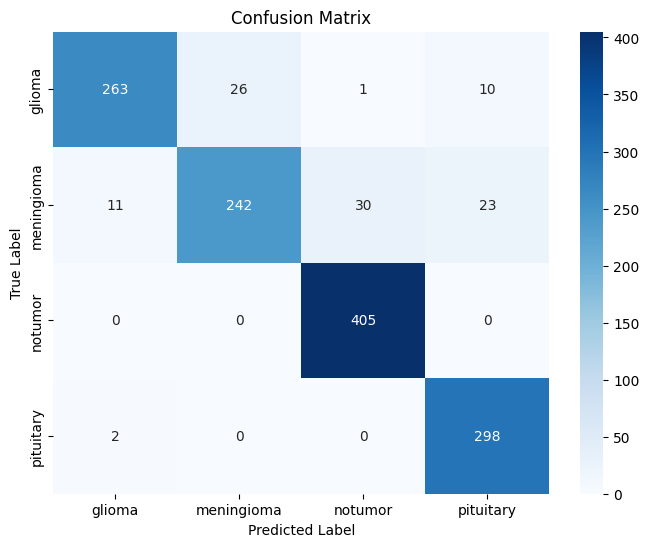

In [10]:
# ================================================================
# 11. Predictions and Metrics
# ================================================================
y_pred_prob = best_model.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = test_generator.classes
class_names = list(train_generator.class_indices.keys())

print("\n--- Classification Report ---")
print(classification_report(y_true, y_pred, target_names=class_names))

print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title("Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()

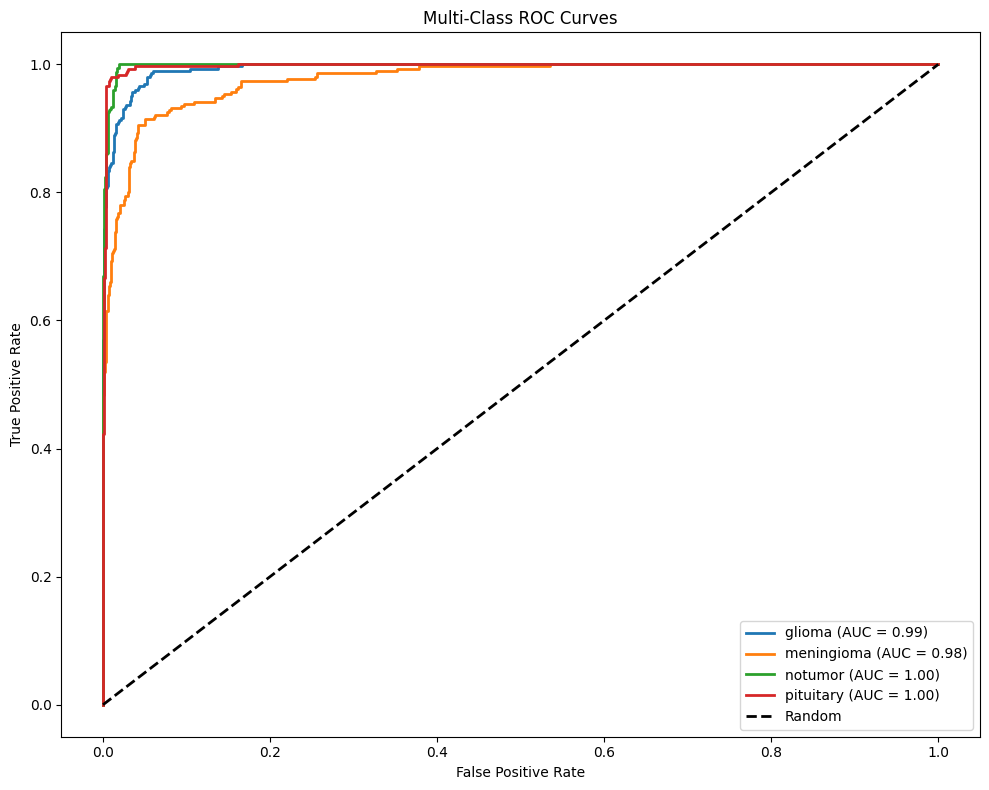

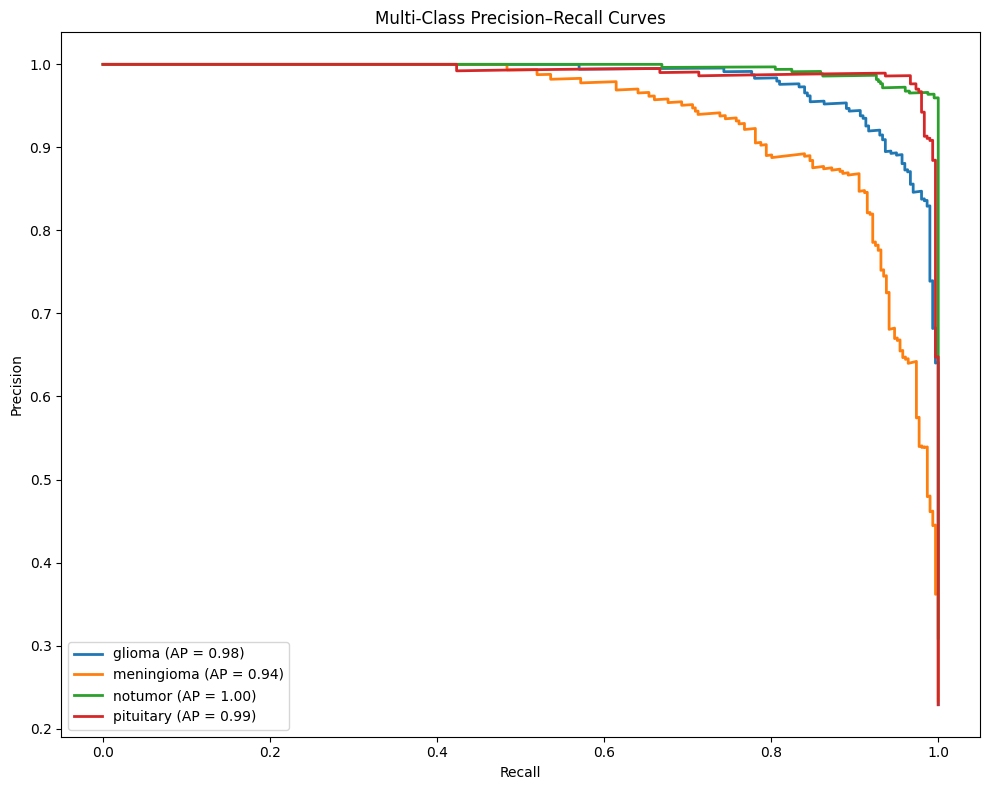

In [11]:
# ================================================================
# 12. ROC & Precision–Recall Curves
# ================================================================
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

y_true_bin = to_categorical(y_true, num_classes=NUM_CLASSES)

# --- ROC Curves ---
plt.figure(figsize=(10, 8))
for i in range(NUM_CLASSES):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--", lw=2, label="Random")
plt.title("Multi-Class ROC Curves")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()

# --- PR Curves ---
plt.figure(figsize=(10, 8))
for i in range(NUM_CLASSES):
    precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_prob[:, i])
    pr_auc = average_precision_score(y_true_bin[:, i], y_pred_prob[:, i])
    plt.plot(recall, precision, lw=2, label=f"{class_names[i]} (AP = {pr_auc:.2f})")

plt.title("Multi-Class Precision–Recall Curves")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.tight_layout()
plt.show()

## 4. Transfer Learning - EfficientNetB0

In [6]:
# ================================================================
# TRANSFER LEARNING WITH EFFICIENTNETB0
# ================================================================

# === 1. Imports ===
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight


# ================================================================
# 2. Define Constants
# ================================================================
IMG_WIDTH = 224
IMG_HEIGHT = 224
INPUT_SHAPE = (IMG_WIDTH, IMG_HEIGHT, 3)
BATCH_SIZE = 32
VAL_SPLIT = 0.2  # 20% validation

# === Train/Validation split ===
df_train_split, df_val_split = train_test_split(
    train_df,
    test_size=VAL_SPLIT,
    stratify=train_df['label'],  # preserve class ratios
    random_state=42
)

print(f"Total original training images: {len(train_df)}")
print(f"New training split size: {len(df_train_split)}")
print(f"New validation split size: {len(df_val_split)}")
print(f"Test set size (untouched): {len(test_df)}")

Total original training images: 5712
New training split size: 4569
New validation split size: 1143
Test set size (untouched): 1311


In [7]:
# ================================================================
# 3. Data Generators
# ================================================================

# Training generator with augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Validation/Test generator (no augmentation)
valid_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Training generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train_split,
    x_col='image_path',
    y_col='label',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True
)

# Validation generator
validation_generator = valid_datagen.flow_from_dataframe(
    dataframe=df_val_split,
    x_col='image_path',
    y_col='label',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Test generator
test_generator = valid_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='image_path',
    y_col='label',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

print(f"Test images found: {test_generator.n}")


# ================================================================
# 4. Compute class weights
# ================================================================

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

print("Class weights:", class_weights)

Found 4569 validated image filenames belonging to 4 classes.
Found 1143 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.
Test images found: 1311
Class weights: {0: 1.0806527909176915, 1: 1.0665266106442577, 2: 0.895180250783699, 3: 0.9804721030042919}


In [8]:
# ================================================================
# 5. Callbacks
# ================================================================

tl_checkpoint_cb = ModelCheckpoint(
    "best_tl_model.keras",
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

tl_early_stopping_cb = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

tl_reduce_lr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

callbacks_list = [tl_checkpoint_cb, tl_early_stopping_cb, tl_reduce_lr_cb]

In [11]:
# ================================================================
# 6. Model Architecture - EfficientNetB0 Backbone + Custom Head
# ================================================================
print("\nBuilding EfficientNetB0 Transfer Learning Model")

# Load pretrained EfficientNetB0 (feature extractor only)
base_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=INPUT_SHAPE
)
base_model.trainable = False  # freeze backbone

# Classification head
inputs = Input(shape=INPUT_SHAPE, name="input_layer")
x = base_model(inputs, training=False)  # keep BatchNorm frozen
x = GlobalAveragePooling2D(name="global_avg_pool")(x)
x = Dense(256, activation='relu', name="head_dense")(x)
x = Dropout(0.3, name="head_dropout")(x)
outputs = Dense(NUM_CLASSES, activation='softmax', name="output_layer")(x)

tl_model = Model(inputs, outputs, name="TransferLearning_EfficientNetB0")


Building EfficientNetB0 Transfer Learning Model


In [ ]:
# ================================================================
# 7. Phase 1: Train the classification head
# ================================================================
print("\n Phase 1: Training the classification head...")

tl_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_phase1 = tl_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks_list
)

print("\nPhase 1 completed. Model trained on classification head only.")

In [ ]:
# ================================================================
# 8. Phase 2: Fine-tuning
# ================================================================
print("\n Phase 2: Fine-tuning the base model...")

# Unfreeze some layers (typically last 30% of the backbone)
base_model.trainable = True
fine_tune_at = int(len(base_model.layers) * 0.7)
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

tl_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_phase2 = tl_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks_list
)

print("\nFine-tuning completed successfully")

In [ ]:
# === Save final model ===
tl_model.save("final_tl_model.keras")
print("Model saved: final_tl_model.keras")

In [16]:
# Load best saved model
best_tl_model = load_model(
    '/kaggle/input/mri-tumor-classification-tl-model/keras/default/2/final_tl_model.keras'
)

# ================================================================
# 9. Evaluate the model
# ================================================================
val_loss, val_acc = best_tl_model.evaluate(validation_generator)
print(f"Final Validation Accuracy: {val_acc:.2%}")
print(f"Final Validation Loss: {val_loss:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



36/36 ━━━━━━━━━━━━━━━━━━━━ 308s 8s/step - accuracy: 1.0000 - loss: 0.0086
Final Validation Accuracy: 99.91%
Final Validation Loss: 0.0096


In [17]:
# ================================================================
# 10. Plot Training Curves
# ================================================================
import matplotlib.pyplot as plt

def plot_history(history, title):
    plt.figure(figsize=(8,4))
    plt.plot(history.history['accuracy'], label='train_acc')
    plt.plot(history.history['val_accuracy'], label='val_acc')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

plot_history(history_phase1, "Phase 1: Head Training")
plot_history(history_phase2, "Phase 2: Fine-Tuning")

NameError: name 'history_phase1' is not defined


Evaluating on Test Set...
41/41 ━━━━━━━━━━━━━━━━━━━━ 349s 9s/step - accuracy: 0.9888 - loss: 0.0291
Test Loss:     0.0566
Test Accuracy: 0.9779
41/41 ━━━━━━━━━━━━━━━━━━━━ 360s 9s/step

Classification Report:
              precision    recall  f1-score   support

      glioma       0.96      0.97      0.97       300
  meningioma       0.98      0.94      0.96       306
     notumor       0.99      1.00      0.99       405
   pituitary       0.99      0.99      0.99       300

    accuracy                           0.98      1311
   macro avg       0.98      0.98      0.98      1311
weighted avg       0.98      0.98      0.98      1311



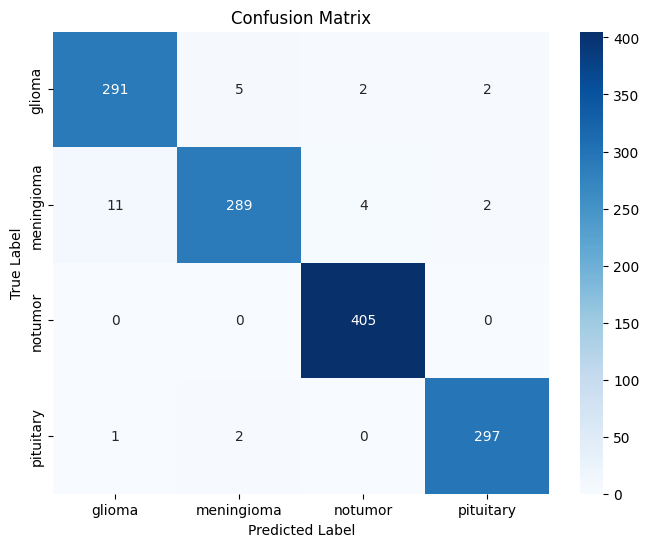

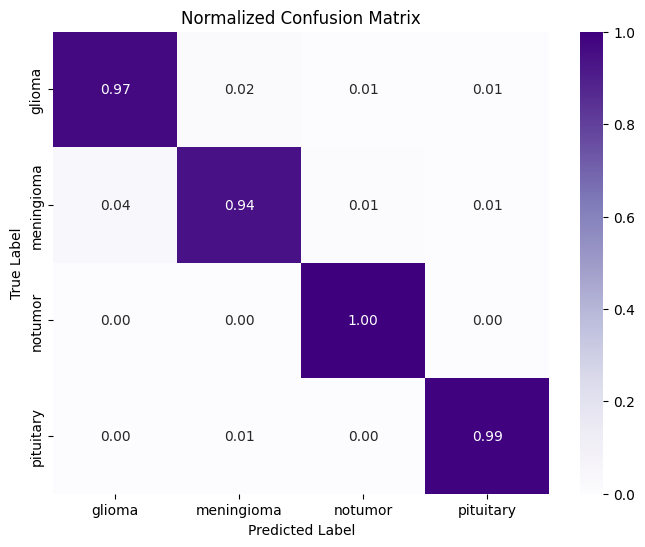

In [18]:
# ================================================================
# 11. Testing on the Test Set
# ================================================================

import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# === 2. Evaluate on test set ===
print("\nEvaluating on Test Set...")
test_loss, test_accuracy = best_tl_model.evaluate(test_generator)
print(f"Test Loss:     {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# === 3. Predictions ===
test_steps = len(test_generator)
y_pred_prob = best_tl_model.predict(test_generator, steps=test_steps, verbose=1)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = test_generator.classes

# === 4. Class names ===
class_names = list(test_generator.class_indices.keys())

# === 5. Classification report ===
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# === 6. Confusion matrix ===
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# === 7. Normalized confusion matrix ===
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(8, 6))
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Purples',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Normalized Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## 5. Grad-CAM

Loading best Transfer Learning model...
Loaded: final_tl_model.keras
No rescale attribute found. Using 1.0.
Selecting random examples for 4 classes...
  -> Selected for glioma: /kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/classification/Testing/glioma/enh_Te-gl_0151.jpg
  -> Selected for meningioma: /kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/classification/Testing/meningioma/enh_Te-me_0058.jpg
  -> Selected for notumor: /kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/classification/Testing/notumor/enh_Te-no_0266.jpg
  -> Selected for pituitary: /kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/classification/Testing/pituitary/enh_Te-pi_0029.jpg


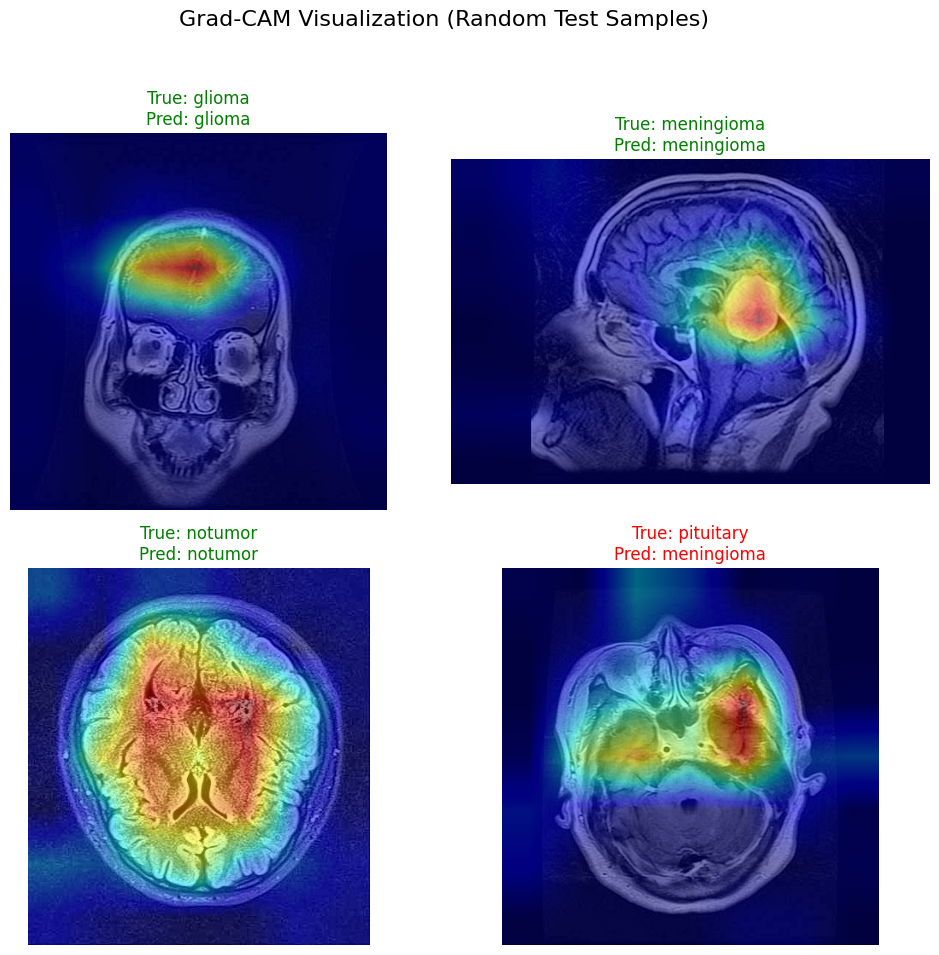

In [12]:
# ================================================================
# 12. Grad-CAM Visualization
# ================================================================

from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing import image
import random


# === 1. Grad-CAM Generation Function ===
def generate_gradcam(model, img_array):
    """Generate Grad-CAM heatmap for a single preprocessed image."""
    try:
        last_conv_layer_output = model.get_layer("global_avg_pool").input
    except Exception as e:
        print(f"ERROR: Could not locate 'global_avg_pool'. {e}")
        return None, None

    grad_model = Model(
        inputs=model.input,
        outputs=[model.output, last_conv_layer_output]
    )

    with tf.GradientTape() as tape:
        preds, conv_outputs = grad_model(img_array)
        class_idx = tf.argmax(preds[0])
        loss = preds[:, class_idx]

    gradients = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(gradients, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0)
    if tf.reduce_max(heatmap) > 0:
        heatmap /= tf.reduce_max(heatmap)

    return heatmap.numpy(), class_idx.numpy()


# === 2. Heatmap Overlay Function ===
def show_gradcam_superimposed(img, heatmap, true_class, pred_class, alpha=0.5):
    """Superimpose Grad-CAM heatmap on the original image."""
    heatmap_resized = tf.image.resize(
        heatmap[..., tf.newaxis], (img.shape[0], img.shape[1])
    ).numpy()

    img_to_show = img.copy()
    if img_to_show.max() > 1.0:
        img_to_show = img_to_show / 255.0

    title_color = "green" if true_class == pred_class else "red"

    plt.imshow(img_to_show)
    plt.imshow(heatmap_resized, cmap="jet", alpha=alpha)
    plt.title(f"True: {true_class}\nPred: {pred_class}", color=title_color)
    plt.axis("off")


# === 3. Load Best Transfer Learning Model ===
print("Loading best Transfer Learning model...")
try:
    best_tl_model = load_model(
        "/kaggle/input/mri-tumor-classification-tl-model/keras/default/2/final_tl_model.keras"
    )
    print("Loaded: final_tl_model.keras")
except Exception as e:
    print(f"ERROR: Model not found. {e}")
    # Optional: fallback
    # best_tl_model = tl_model


# === 4. Test Set Metadata Extraction ===
class_names = list(test_generator.class_indices.keys())
num_classes = len(class_names)

test_dir = test_generator.directory
all_filenames = test_generator.filenames
all_class_indices = test_generator.classes
target_size = test_generator.target_size

try:
    rescale_factor = test_generator.rescale
    print(f"Rescale factor detected: {rescale_factor}")
except AttributeError:
    print("No rescale attribute found. Using 1.0.")
    rescale_factor = 1.0


# === 5. Random Sample Selection per Class ===
print(f"Selecting random examples for {num_classes} classes...")

class_to_indices = {i: [] for i in range(num_classes)}
for i, cls_idx in enumerate(all_class_indices):
    class_to_indices[cls_idx].append(i)

examples_to_plot = {}

for class_idx, class_name in enumerate(class_names):

    if not class_to_indices[class_idx]:
        print(f"WARNING: No samples for class {class_name}.")
        continue

    random_idx = random.choice(class_to_indices[class_idx])
    filename = all_filenames[random_idx]
    filepath = os.path.join(test_dir, filename)

    try:
        img_original = plt.imread(filepath)
        if len(img_original.shape) == 2:
            img_original = np.stack([img_original] * 3, axis=-1)

        img_resized = image.load_img(filepath, target_size=target_size)
        img_preprocessed = image.img_to_array(img_resized)
        img_preprocessed *= rescale_factor

        examples_to_plot[class_idx] = (img_original, img_preprocessed)
        print(f"  -> Selected for {class_name}: {filename}")

    except Exception as e:
        print(f"Error reading {filepath}: {e}")


# === 6. Grad-CAM Visualization Grid ===
num_found = len(examples_to_plot)

if num_found == 0:
    print("ERROR: No examples available for visualization.")

else:
    cols = int(np.ceil(np.sqrt(num_found)))
    rows = int(np.ceil(num_found / cols))

    plt.figure(figsize=(cols * 5, rows * 5))
    plot_index = 1

    for true_idx in sorted(examples_to_plot.keys()):

        img_original, img_preprocessed = examples_to_plot[true_idx]
        img_batch = np.expand_dims(img_preprocessed, axis=0)

        heatmap, pred_idx = generate_gradcam(best_tl_model, img_batch)

        if heatmap is None:
            print(f"Grad-CAM failed for class {class_names[true_idx]}.")
            continue

        true_class = class_names[true_idx]
        pred_class = class_names[pred_idx]

        plt.subplot(rows, cols, plot_index)
        show_gradcam_superimposed(img_original, heatmap, true_class, pred_class)
        plot_index += 1

    plt.suptitle("Grad-CAM Visualization (Random Test Samples)", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


## 6. Conclusion & Model Validation


This project culminated in the development of two models: a baseline custom CNN and a model based on Transfer Learning (EfficientNetB0).

### Quantitative Performance
The test set metrics clearly establish the superiority of the **Transfer Learning model**, which was selected for our final analysis.

* **Overall Accuracy:** The TL model achieved **98% accuracy**, significantly outperforming the custom CNN's 92%.
* **Class-Specific Improvement:** The TL model demonstrated robust and balanced performance, achieving F1-scores of 0.96 or higher for all classes. This marks a crucial improvement over the custom CNN, which struggled with `meningioma` (0.84 F1-score, 79% recall).
* **Reliability:** With a weighted F1-score of 0.98, the TL model is not only accurate but also highly reliable across the entire dataset.

### Interpretability (XAI) Findings
Achieving high accuracy is only the first step in medical imaging. The primary goal of integrating Explainable AI (XAI) was to move this 98%-accurate model from a "black box" to a transparent and trustworthy tool.

1.  **Validating the "Why":** The Grad-CAM heatmaps consistently proved that the model's predictions are based on **biologically relevant regions**. Its focus correctly converged on the tumorous masses, confirming it has learned valid pathological features, not just spurious correlations in the data.

2.  **Building Trust:** This visual evidence is critical for building trust. We can now state not only *that* the model is 98% accurate, but also *why* it works—it is genuinely identifying the features of `pituitary`, `glioma`, and `meningioma` tumors.

### Visual Evidence of Interpretability

Below are illustrative Grad-CAM examples demonstrating the model's localized attention on the specific tumor regions for various classes:

**Glioma Detection:**
Observation: The heatmap clearly highlights the diffuse borders and irregular shape characteristic of a glioma within the brain parenchyma.

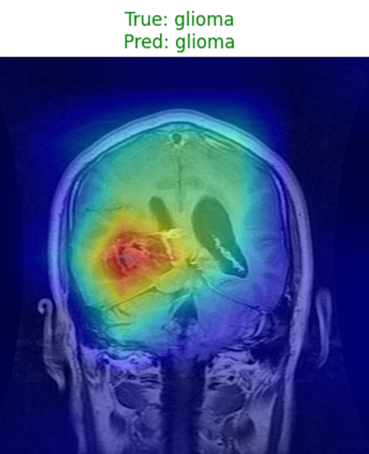



**Meningioma Detection:**
Observation: Here, the model precisely focuses on the well-defined, often rounded mass typically associated with a meningioma, distinct from the surrounding brain tissue.

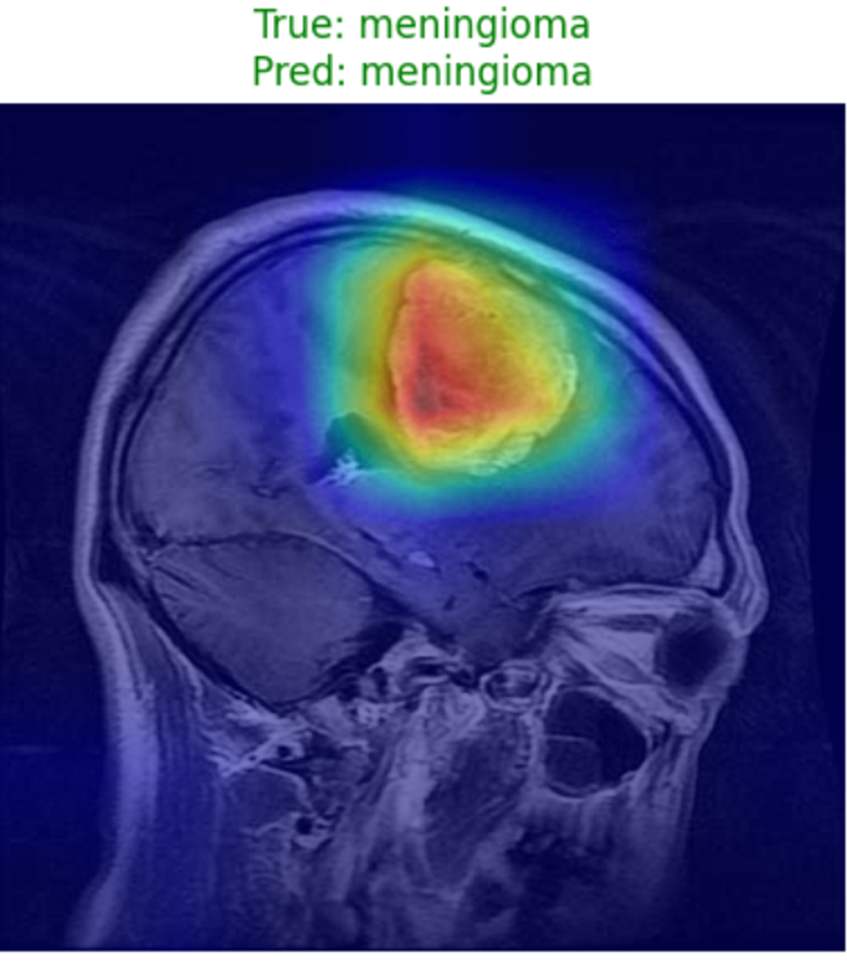

**Pituitary Tumor Detection:**
The heatmap accurately pinpoints the tumor located near the sella turcica, consistent with the expected anatomical position of a pituitary adenoma.

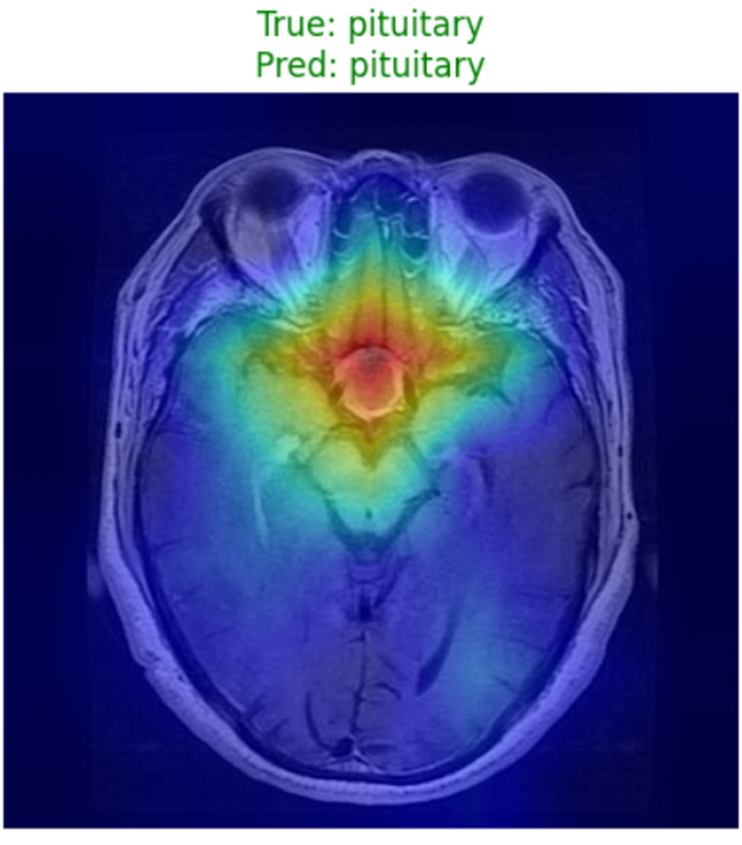


`
**No Tumor (Healthy Brain):**
In cases classified as 'No Tumor', the heatmap shows no concentrated activation on any specific lesion, indicating that the model correctly identifies the absence of pathological features. 

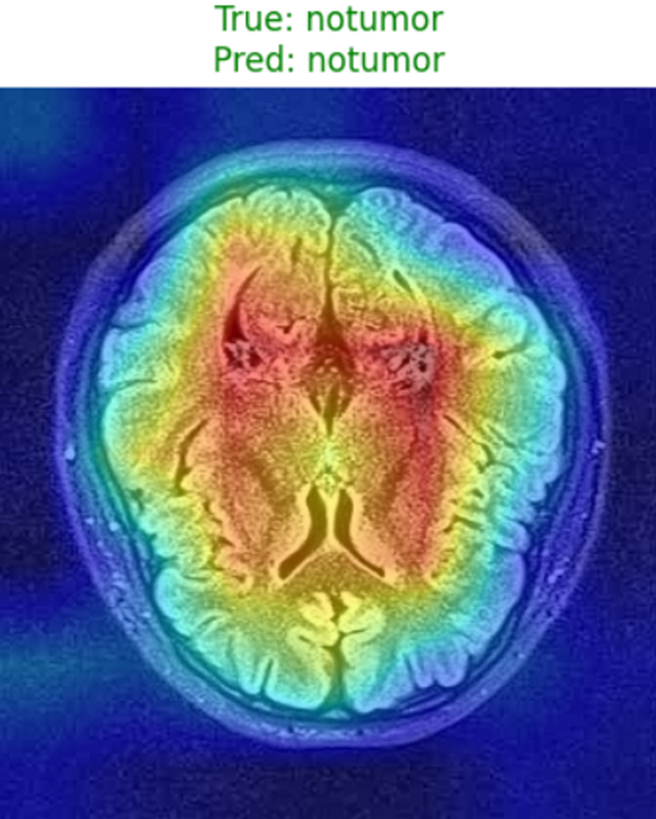

### Conclusion

This project delivered a classification model with 98% accuracy, whose reliability was validated by XAI (Grad-CAM), proving it bases its decisions on relevant tumor regions. While it stands as a powerful semantic classification tool (not segmentation), its effectiveness on crucial early-stage tumor detection remains a critical area for a future project
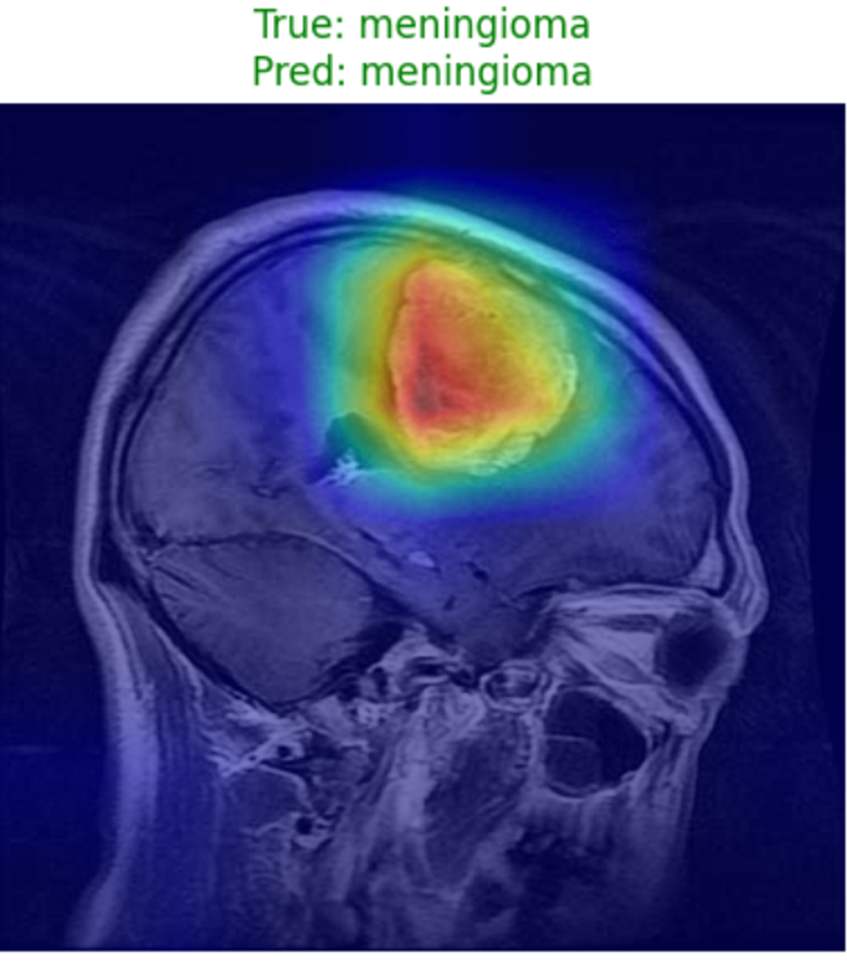
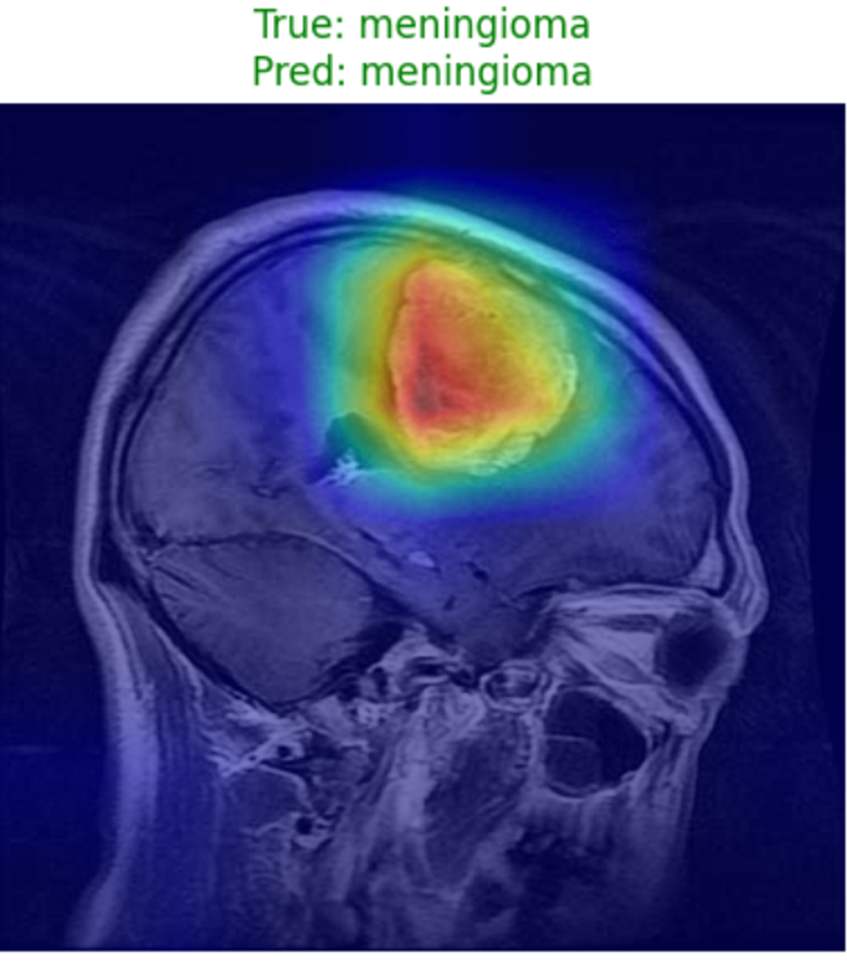
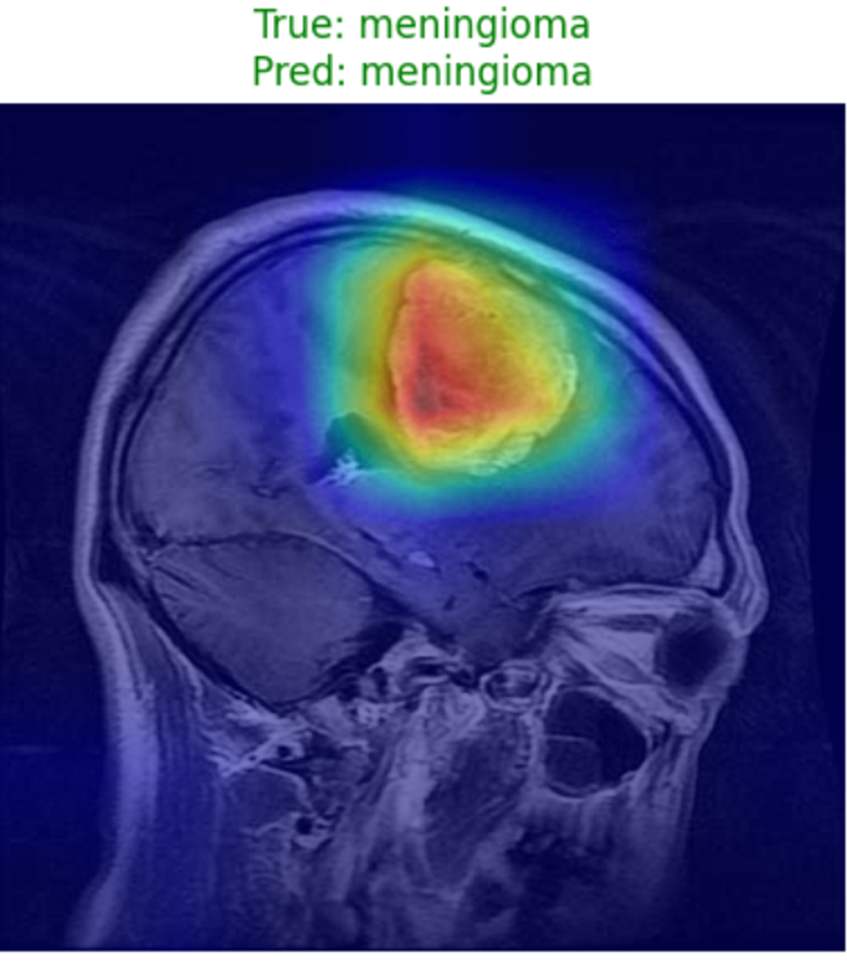
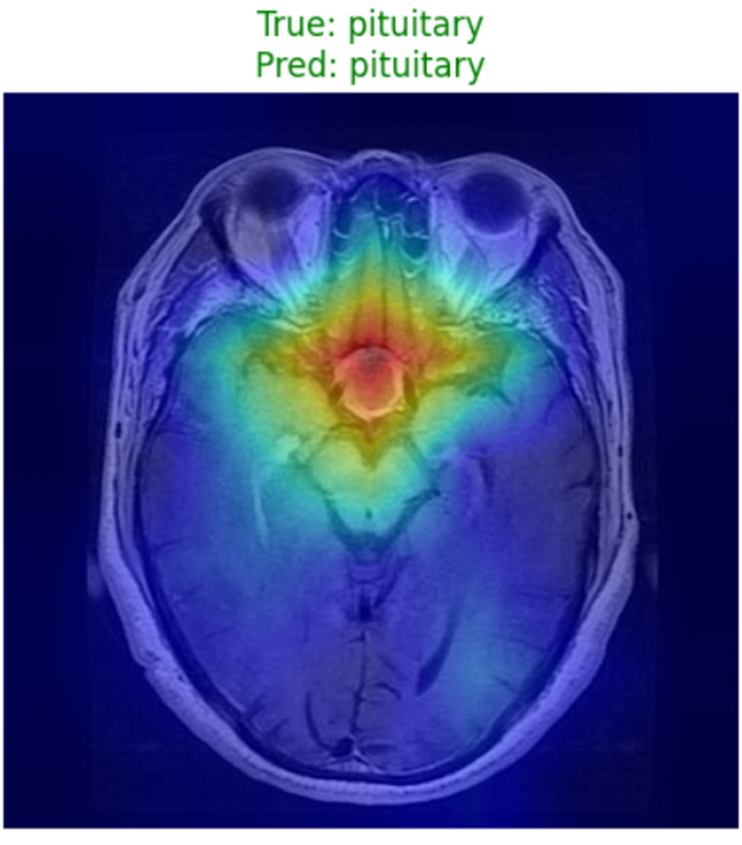
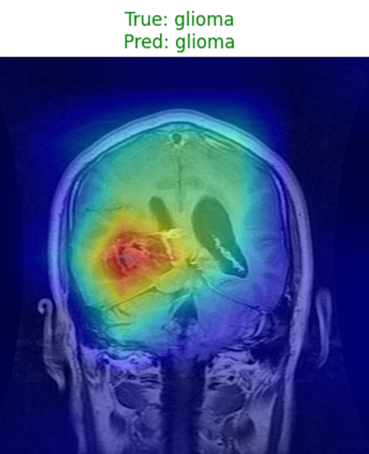
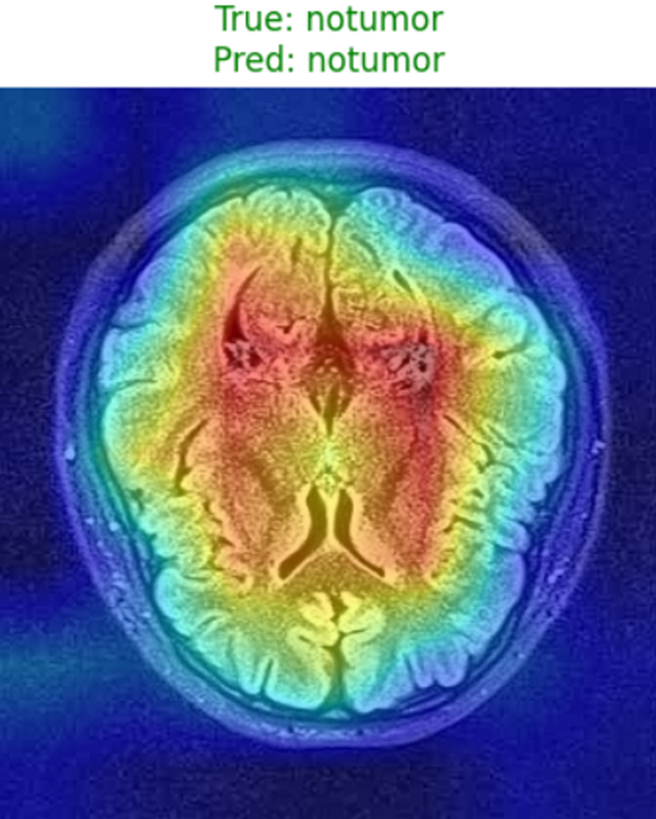